# Summary 


I have performed an experiment to evaluate the performance of the autoencoder model with varying numbers of neurons in the hidden layer. I have trained the same version of the model with neuron counts ranging from 10 to 60. For each model, I have saved the version with the lowest validation loss during training. After evaluating all models, I have found that the model with 44 neurons in the hidden layer achieved the lowest mean squared error (MSE) of approximately 2.78e-05 on the normalized data. This suggests that, for this specific problem and dataset, the autoencoder with 44 neurons in the hidden layer provides the best performance in terms of MSE.

# Importing the required libraries

In [1]:
import os
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Dense
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split
from keras.models import load_model
from sklearn.metrics import mean_squared_error
import pandas as pd

# Extracting the city coordinates from the TSP file

In [7]:
directory = "instances\\instances"
tsp_files = [os.path.join(directory, file) for file in os.listdir(directory) if file.endswith('.tsp')]

all_data = []
node_counts = []

for tsp_file in tqdm(tsp_files, desc="Processing files"):
    with open(tsp_file, 'r') as file:
        line = next(file)
        while "NODE_COORD_SECTION" not in line:
            line = next(file)
        data = file.readlines()
        data = data[:-1]
        data = np.array([[float(x) for x in line.split()[1:]] for line in data])
        all_data.append(data)
        node_counts.append(len(data))

average_node_count = sum(node_counts) / len(node_counts)
print(f"Average node count: {average_node_count}")

Processing files: 100%|██████████| 85/85 [00:00<00:00, 5475.00it/s]

Average node count: 29.0


In [8]:
all_data

[array([[6075.80690883, 6465.45909703],
        [1805.70936324, 7995.40708724],
        [5445.28520579, 4709.20131029],
        [4958.44692288, 4673.99712767],
        [2533.03662596, 3778.68980327],
        [5038.68622672, 9796.68082874],
        [6903.3503692 , 4121.00671839],
        [7731.86159653, 8600.15855725],
        [6109.27394038, 4844.82230302],
        [5669.76696326, 6325.04570949],
        [4203.46698965, 9567.63730817],
        [9513.85872349, 7458.0256731 ],
        [8418.09143448, 2834.239121  ],
        [3805.69633892,  701.2654226 ],
        [3408.63315541, 4874.74892224],
        [3582.42753262, 6734.82379683],
        [7579.38368103, 8807.63612896],
        [4465.23067265, 4254.65677598],
        [3426.01275677, 6253.61220366],
        [6655.96131254, 5903.31317429],
        [6321.24269797, 5975.00697937],
        [6949.93866269, 5136.07976256],
        [3670.93053929, 5273.2679205 ],
        [8398.71945481, 1526.18903204],
        [8242.73103951, 2731.55327006],


# Graphing the city coordinates

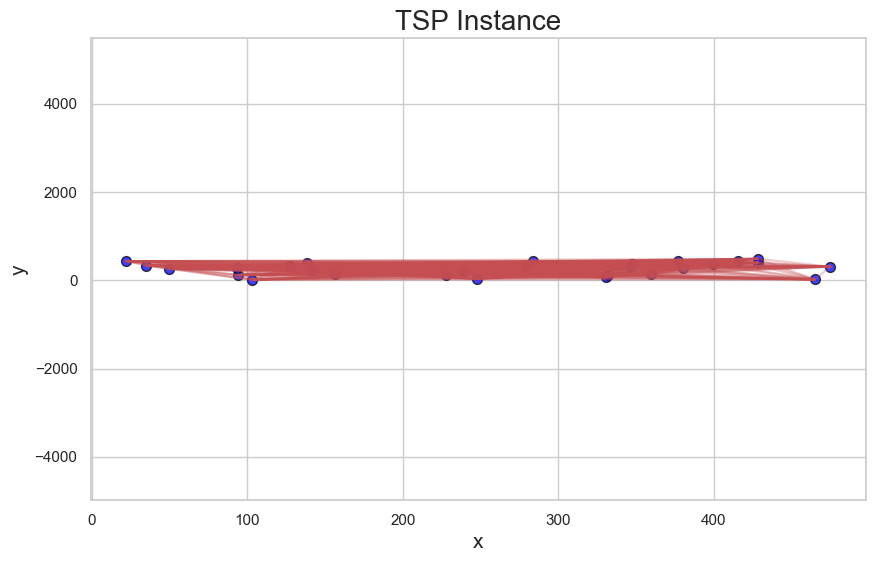

In [9]:
sns.set(style="whitegrid")
data = random.choice(all_data)
x, y = data[:, 0], data[:, 1]

plt.figure(figsize=(10, 6))
plt.scatter(x, y, s=50, c='blue', edgecolors='black', linewidth=1, alpha=0.75)

for j in range(len(x)):
    for k in range(j+1, len(x)):
        plt.plot([x[j], x[k]], [y[j], y[k]], 'r-', alpha=0.3)

plt.ylim(min(y) - 5000, max(y) + 5000)

plt.title('TSP Instance', fontsize=20)
plt.xlabel('x', fontsize=15)
plt.ylabel('y', fontsize=15)

plt.show()

# Normalizing the coordinates

In [10]:
scaler = MinMaxScaler()
normalized_data = []

for data in all_data:
    normalized_data.append(scaler.fit_transform(data))

In [11]:
normalized_data

[array([[0.55397182, 0.63374716],
        [0.        , 0.80195806],
        [0.47217246, 0.44065452],
        [0.40901355, 0.43678398],
        [0.09435822, 0.33834896],
        [0.41942323, 1.        ],
        [0.66133137, 0.37598517],
        [0.76881648, 0.86844776],
        [0.55831359, 0.45556544],
        [0.50129511, 0.61830934],
        [0.31106787, 0.9748177 ],
        [1.        , 0.74287539],
        [0.85784301, 0.23451086],
        [0.25946396, 0.        ],
        [0.20795183, 0.45885573],
        [0.23049867, 0.6633626 ],
        [0.74903509, 0.89125899],
        [0.34502722, 0.39067939],
        [0.21020654, 0.61045555],
        [0.62923689, 0.57194174],
        [0.5858129 , 0.57982416],
        [0.6673754 , 0.48758788],
        [0.24198041, 0.5026711 ],
        [0.85532983, 0.09069664],
        [0.83509301, 0.22322101],
        [0.52278943, 0.67716175],
        [0.58651642, 0.40206787],
        [0.86096475, 0.01355847],
        [0.41617046, 0.32043499]]),
 array([[0.3

# Defining the architecture of the autoencoder

In [12]:
def create_autoencoder(neurons=64):
    encoding_dim = 32

    input_data = Input(shape=(29,2))

    encoded = Dense(neurons, activation='relu')(input_data)
    encoded = Dense(encoding_dim, activation='relu', activity_regularizer=regularizers.l1(10e-5))(encoded)  
    decoded = Dense(neurons, activation='relu')(encoded)
    decoded = Dense(2, activation='sigmoid')(decoded)

    autoencoder = Model(input_data, decoded)
    encoder = Model(input_data, encoded)

    encoded_input = Input(shape=(encoding_dim,))
    decoder_layer1 = autoencoder.layers[-2]
    decoder_layer2 = autoencoder.layers[-1]
    decoder = Model(encoded_input, decoder_layer2(decoder_layer1(encoded_input)))

    autoencoder.compile(optimizer='adam', loss='mean_squared_error')

    return autoencoder, encoder, decoder

In [13]:
autoencoder, encoder, decoder = create_autoencoder(neurons=50)
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 29, 2)]           0         
                                                                 
 dense (Dense)               (None, 29, 50)            150       
                                                                 
 dense_1 (Dense)             (None, 29, 32)            1632      
                                                                 
 dense_2 (Dense)             multiple                  1650      
                                                                 
 dense_3 (Dense)             multiple                  102       
                                                                 
Total params: 3534 (13.80 KB)
Trainable params: 3534 (13.80 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [20]:
normalized_data = np.stack(normalized_data, axis=0)
for neurons in range(10, 61):
    print(f"Training model with {neurons} neurons")
    autoencoder, encoder, decoder = create_autoencoder(neurons=neurons)
    checkpoint = ModelCheckpoint(f'best_model_TSP_With_Less_HiddenLayer_{neurons}.h5', monitor='val_loss', verbose=1, save_best_only=True, mode='min')
    history = autoencoder.fit(normalized_data, normalized_data, epochs=2000, validation_split=0.2, verbose=0, callbacks=[checkpoint])

Training model with 10 neurons

Epoch 1: val_loss improved from inf to 0.09676, saving model to best_model_TSP_With_Less_HiddenLayer_10.h5

Epoch 2: val_loss improved from 0.09676 to 0.09578, saving model to best_model_TSP_With_Less_HiddenLayer_10.h5

Epoch 3: val_loss improved from 0.09578 to 0.09495, saving model to best_model_TSP_With_Less_HiddenLayer_10.h5

Epoch 4: val_loss improved from 0.09495 to 0.09423, saving model to best_model_TSP_With_Less_HiddenLayer_10.h5

Epoch 5: val_loss improved from 0.09423 to 0.09355, saving model to best_model_TSP_With_Less_HiddenLayer_10.h5

Epoch 6: val_loss improved from 0.09355 to 0.09290, saving model to best_model_TSP_With_Less_HiddenLayer_10.h5

Epoch 7: val_loss improved from 0.09290 to 0.09237, saving model to best_model_TSP_With_Less_HiddenLayer_10.h5

Epoch 8: val_loss improved from 0.09237 to 0.09193, saving model to best_model_TSP_With_Less_HiddenLayer_10.h5

Epoch 9: val_loss improved from 0.09193 to 0.09155, saving model to best_mod

### Get a list of all h5 files that match the pattern

In [22]:
h5_files = [f for f in os.listdir('.') if f.startswith('best_model_TSP_With_Less_HiddenLayer_') and f.endswith('.h5')]

losses = []
neuron_counts = []

for h5_file in tqdm(h5_files):
    model = load_model(h5_file)
    pred = model.predict(normalized_data)
    loss = mean_squared_error(normalized_data.flatten(), pred.flatten())
    losses.append(loss)
    neuron_counts.append(int(h5_file.split('_')[-1].split('.')[0]))  



  0%|          | 0/51 [00:00<?, ?it/s]

3/3 [==============================] - 0s 0s/step


  2%|▏         | 1/51 [00:00<00:20,  2.44it/s]

3/3 [==============================] - 0s 1ms/step


  4%|▍         | 2/51 [00:02<01:10,  1.44s/it]

3/3 [==============================] - 0s 3ms/step


  6%|▌         | 3/51 [00:03<00:49,  1.03s/it]

3/3 [==============================] - 0s 4ms/step


  8%|▊         | 4/51 [00:03<00:37,  1.25it/s]

3/3 [==============================] - 0s 0s/step


 10%|▉         | 5/51 [00:04<00:32,  1.42it/s]

3/3 [==============================] - 0s 0s/step


 12%|█▏        | 6/51 [00:05<00:39,  1.14it/s]

3/3 [==============================] - 0s 3ms/step


 14%|█▎        | 7/51 [00:06<00:37,  1.17it/s]

3/3 [==============================] - 0s 5ms/step


 16%|█▌        | 8/51 [00:06<00:35,  1.20it/s]

3/3 [==============================] - 0s 2ms/step


 18%|█▊        | 9/51 [00:07<00:30,  1.38it/s]

3/3 [==============================] - 0s 2ms/step


 20%|█▉        | 10/51 [00:07<00:25,  1.63it/s]

3/3 [==============================] - 0s 0s/step


 22%|██▏       | 11/51 [00:08<00:20,  1.91it/s]

3/3 [==============================] - 0s 0s/step


 24%|██▎       | 12/51 [00:08<00:18,  2.08it/s]

3/3 [==============================] - 0s 5ms/step


 25%|██▌       | 13/51 [00:08<00:17,  2.18it/s]

3/3 [==============================] - 0s 0s/step


 27%|██▋       | 14/51 [00:09<00:16,  2.24it/s]

3/3 [==============================] - 0s 0s/step


 29%|██▉       | 15/51 [00:09<00:14,  2.53it/s]

3/3 [==============================] - 0s 2ms/step


 31%|███▏      | 16/51 [00:09<00:13,  2.53it/s]

3/3 [==============================] - 0s 6ms/step


 33%|███▎      | 17/51 [00:10<00:12,  2.64it/s]

3/3 [==============================] - 0s 2ms/step


 35%|███▌      | 18/51 [00:10<00:11,  2.77it/s]

3/3 [==============================] - 0s 0s/step


 37%|███▋      | 19/51 [00:11<00:12,  2.58it/s]

3/3 [==============================] - 0s 0s/step


 39%|███▉      | 20/51 [00:11<00:12,  2.52it/s]

3/3 [==============================] - 0s 5ms/step


 41%|████      | 21/51 [00:11<00:11,  2.61it/s]

3/3 [==============================] - 0s 5ms/step


 43%|████▎     | 22/51 [00:12<00:10,  2.81it/s]

3/3 [==============================] - 0s 0s/step


 45%|████▌     | 23/51 [00:12<00:09,  2.91it/s]

3/3 [==============================] - 0s 3ms/step


 47%|████▋     | 24/51 [00:12<00:09,  2.99it/s]

3/3 [==============================] - 0s 2ms/step


 49%|████▉     | 25/51 [00:13<00:09,  2.67it/s]

3/3 [==============================] - 0s 0s/step


 51%|█████     | 26/51 [00:13<00:09,  2.55it/s]

3/3 [==============================] - 0s 0s/step


 53%|█████▎    | 27/51 [00:13<00:08,  2.72it/s]

3/3 [==============================] - 0s 5ms/step


 55%|█████▍    | 28/51 [00:14<00:08,  2.81it/s]

3/3 [==============================] - 0s 4ms/step


 57%|█████▋    | 29/51 [00:14<00:07,  2.81it/s]

3/3 [==============================] - 0s 3ms/step


 59%|█████▉    | 30/51 [00:15<00:07,  2.77it/s]

3/3 [==============================] - 0s 3ms/step


 61%|██████    | 31/51 [00:15<00:07,  2.52it/s]

3/3 [==============================] - 0s 5ms/step


 63%|██████▎   | 32/51 [00:15<00:07,  2.63it/s]

3/3 [==============================] - 0s 0s/step


 65%|██████▍   | 33/51 [00:16<00:06,  2.65it/s]

3/3 [==============================] - 0s 3ms/step


 67%|██████▋   | 34/51 [00:16<00:06,  2.74it/s]

3/3 [==============================] - 0s 0s/step


 69%|██████▊   | 35/51 [00:16<00:05,  2.73it/s]

3/3 [==============================] - 0s 3ms/step


 71%|███████   | 36/51 [00:17<00:06,  2.21it/s]

3/3 [==============================] - 0s 2ms/step


 73%|███████▎  | 37/51 [00:17<00:06,  2.24it/s]

3/3 [==============================] - 0s 165us/step


 75%|███████▍  | 38/51 [00:18<00:05,  2.37it/s]

3/3 [==============================] - 0s 6ms/step


 76%|███████▋  | 39/51 [00:18<00:04,  2.40it/s]

3/3 [==============================] - 0s 3ms/step


 78%|███████▊  | 40/51 [00:19<00:04,  2.54it/s]

3/3 [==============================] - 0s 166us/step


 80%|████████  | 41/51 [00:19<00:03,  2.60it/s]

3/3 [==============================] - 0s 0s/step


 82%|████████▏ | 42/51 [00:19<00:03,  2.70it/s]

3/3 [==============================] - 0s 2ms/step


 84%|████████▍ | 43/51 [00:20<00:03,  2.61it/s]

3/3 [==============================] - 0s 3ms/step


 86%|████████▋ | 44/51 [00:20<00:02,  2.73it/s]

3/3 [==============================] - 0s 5ms/step


 88%|████████▊ | 45/51 [00:20<00:02,  2.80it/s]

3/3 [==============================] - 0s 0s/step


 90%|█████████ | 46/51 [00:21<00:01,  2.92it/s]

3/3 [==============================] - 0s 3ms/step


 92%|█████████▏| 47/51 [00:21<00:01,  2.70it/s]

3/3 [==============================] - 0s 2ms/step


 94%|█████████▍| 48/51 [00:21<00:01,  2.86it/s]

3/3 [==============================] - 0s 5ms/step


 96%|█████████▌| 49/51 [00:22<00:00,  2.96it/s]

3/3 [==============================] - 0s 5ms/step


 98%|█████████▊| 50/51 [00:22<00:00,  3.15it/s]

3/3 [==============================] - 0s 4ms/step


100%|██████████| 51/51 [00:22<00:00,  2.23it/s]


### Data frame

In [31]:
data = {'neuron': list(range(10, 61)), 'mse': losses}
df = pd.DataFrame(data)
df

,neuron,mse
0,10,0.000055
1,11,0.000082
2,12,0.000042
3,13,0.000053
4,14,0.000057
5,15,0.000054
6,16,0.000054
7,17,0.000051
8,18,0.000076
9,19,0.000074


In [33]:
min_mse_index = df['mse'].idxmin()
min_mse = df['mse'].min()
neuron_with_min_mse = df.loc[min_mse_index, 'neuron']

print(f"The neuron number with the lowest MSE is: {neuron_with_min_mse}")
print(f"The lowest MSE is: {min_mse}")

The neuron number with the lowest MSE is: 44
The lowest MSE is: 2.782560874342677e-05


### Plot neuron count vs loss (MSE)

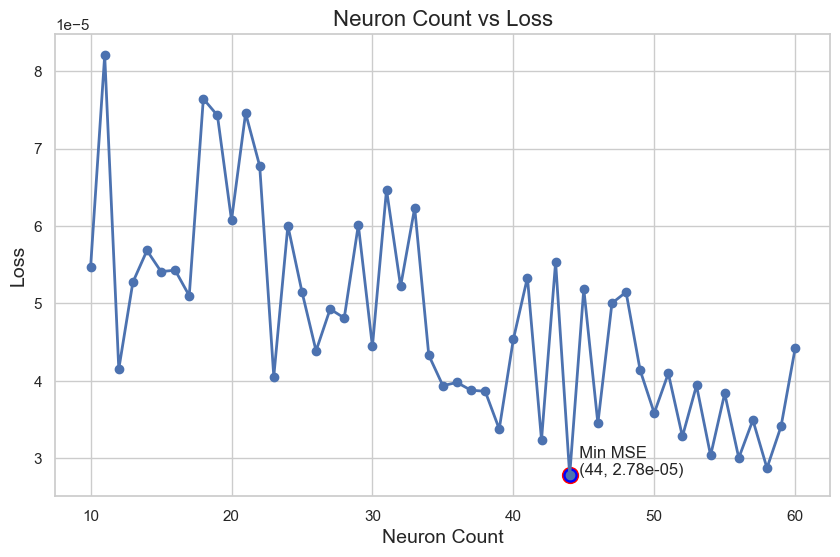

In [44]:
plt.figure(figsize=(10, 6))
plt.scatter(neuron_with_min_mse, min_mse, s=130, color='blue', edgecolors='red')
plt.plot(neuron_counts, losses, 'o-', linewidth=2)
plt.text(neuron_with_min_mse, min_mse, f'  Min MSE\n  ({neuron_with_min_mse}, {min_mse:.2e})')

plt.grid(True, which='both')
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.xlabel('Neuron Count', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Neuron Count vs Loss', fontsize=16)
plt.show()

In [29]:
losses


[5.4697305475344816e-05,
 8.20463099461619e-05,
 4.1525849867833334e-05,
 5.274643286393327e-05,
 5.684094503141338e-05,
 5.411823276715239e-05,
 5.429323251079958e-05,
 5.100228482682347e-05,
 7.643098495951769e-05,
 7.427979239829703e-05,
 6.075559580625134e-05,
 7.456817372042691e-05,
 6.77544622720436e-05,
 4.0566674372819154e-05,
 6.0045236958919905e-05,
 5.151242234300196e-05,
 4.3887028735076535e-05,
 4.928346028646409e-05,
 4.8122619028051235e-05,
 6.014164737585886e-05,
 4.4452432671186945e-05,
 6.470045352685279e-05,
 5.220843783683e-05,
 6.234720105096169e-05,
 4.331792038184009e-05,
 3.939277439826771e-05,
 3.980488579326568e-05,
 3.879085057448799e-05,
 3.8676231157538396e-05,
 3.37897363679201e-05,
 4.536102095482521e-05,
 5.3350829888507906e-05,
 3.237409062295993e-05,
 5.535345045979786e-05,
 2.782560874342677e-05,
 5.188715991417855e-05,
 3.4524718641071764e-05,
 5.004153954061757e-05,
 5.147044809744441e-05,
 4.138190892946053e-05,
 3.585351849371763e-05,
 4.097237577